# Machine learning

## Preprocesing

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

In [2]:
import kagglehub
import os

path = kagglehub.dataset_download("karlorusovan/league-of-legends-soloq-matches-at-10-minutes-2024", force_download=True)

try:
    os.mkdir("./data")
except FileExistsError:
    pass

os.rename(path + "/match_data_v5.csv", "./data/match_data_v5.csv")

100%|████████████████████████████████████████| 979k/979k [00:00<00:00, 1.82MB/s]

Extracting files...


In [3]:
columns = [
    "matchId",
    "blueTeamControlWardsPlaced",
    "blueTeamWardsPlaced",
    "blueTeamTotalKills",
    "blueTeamDragonKills",
    "blueTeamHeraldKills",
    "blueTeamTowersDestroyed",
    "blueTeamInhibitorsDestroyed",
    "blueTeamTurretPlatesDestroyed",
    "blueTeamFirstBlood",
    "blueTeamMinionsKilled",
    "blueTeamJungleMinions",
    "blueTeamTotalGold",
    "blueTeamXp",
    "blueTeamTotalDamageToChamps",
    "redTeamControlWardsPlaced",
    "redTeamWardsPlaced",
    "redTeamTotalKills",
    "redTeamDragonKills",
    "redTeamHeraldKills",
    "redTeamTowersDestroyed",
    "redTeamInhibitorsDestroyed",
    "redTeamTurretPlatesDestroyed",
    "redTeamMinionsKilled",
    "redTeamJungleMinions",
    "redTeamTotalGold",
    "redTeamXp",
    "redTeamTotalDamageToChamps",
    "blueTeamWin",
    "something_else"
]

df = pd.read_csv("./data/match_data_v5.csv", names=columns, skiprows=1, header=None, index_col=False)
df = df.drop(columns=["something_else"])
df.head()

,matchId,blueTeamControlWardsPlaced,blueTeamWardsPlaced,blueTeamTotalKills,blueTeamDragonKills,blueTeamHeraldKills,blueTeamTowersDestroyed,blueTeamInhibitorsDestroyed,blueTeamTurretPlatesDestroyed,blueTeamFirstBlood,...,redTeamHeraldKills,redTeamTowersDestroyed,redTeamInhibitorsDestroyed,redTeamTurretPlatesDestroyed,redTeamMinionsKilled,redTeamJungleMinions,redTeamTotalGold,redTeamXp,redTeamTotalDamageToChamps,blueTeamWin
0,EUW1_6882489515',2,23,4,2,0,0,0,7,0,...,0,2,0,1,400,94,29637,32613,27239,1
1,EUW1_6882416210',2,46,12,1,0,1,0,10,0,...,0,1,0,4,373,76,28970,30320,36585,0
2,EUW1_6881092720',2,19,13,0,0,0,0,11,0,...,0,2,0,3,340,84,30510,29464,42984,0
3,EUW1_6879405717',3,28,8,0,1,1,0,9,1,...,0,0,0,5,378,87,25157,31069,28229,0
4,EUW1_6879389461',3,30,11,1,1,1,0,7,0,...,0,1,0,5,382,96,26052,29475,19245,1


In [4]:
df.dtypes

matchId                          object
blueTeamControlWardsPlaced        int64
blueTeamWardsPlaced               int64
blueTeamTotalKills                int64
blueTeamDragonKills               int64
blueTeamHeraldKills               int64
blueTeamTowersDestroyed           int64
blueTeamInhibitorsDestroyed       int64
blueTeamTurretPlatesDestroyed     int64
blueTeamFirstBlood                int64
blueTeamMinionsKilled             int64
blueTeamJungleMinions             int64
blueTeamTotalGold                 int64
blueTeamXp                        int64
blueTeamTotalDamageToChamps       int64
redTeamControlWardsPlaced         int64
redTeamWardsPlaced                int64
redTeamTotalKills                 int64
redTeamDragonKills                int64
redTeamHeraldKills                int64
redTeamTowersDestroyed            int64
redTeamInhibitorsDestroyed        int64
redTeamTurretPlatesDestroyed      int64
redTeamMinionsKilled              int64
redTeamJungleMinions              int64


No hay variables en tipo string, pero si que hay variables booleanas.


In [5]:
# Contemos los nulos (no deberían haber)
df.isnull().sum()

matchId                          0
blueTeamControlWardsPlaced       0
blueTeamWardsPlaced              0
blueTeamTotalKills               0
blueTeamDragonKills              0
blueTeamHeraldKills              0
blueTeamTowersDestroyed          0
blueTeamInhibitorsDestroyed      0
blueTeamTurretPlatesDestroyed    0
blueTeamFirstBlood               0
blueTeamMinionsKilled            0
blueTeamJungleMinions            0
blueTeamTotalGold                0
blueTeamXp                       0
blueTeamTotalDamageToChamps      0
redTeamControlWardsPlaced        0
redTeamWardsPlaced               0
redTeamTotalKills                0
redTeamDragonKills               0
redTeamHeraldKills               0
redTeamTowersDestroyed           0
redTeamInhibitorsDestroyed       0
redTeamTurretPlatesDestroyed     0
redTeamMinionsKilled             0
redTeamJungleMinions             0
redTeamTotalGold                 0
redTeamXp                        0
redTeamTotalDamageToChamps       0
blueTeamWin         

In [6]:
df.shape

(24225, 29)

In [7]:
dups = df[df.duplicated()]
print(f"Number of duplicate rows: {len(dups)}")

if len(dups) > 0:
    df = df.drop_duplicates()

df.shape

Number of duplicate rows: 7


(24218, 29)

In [8]:
df = df.drop(columns=["matchId"])

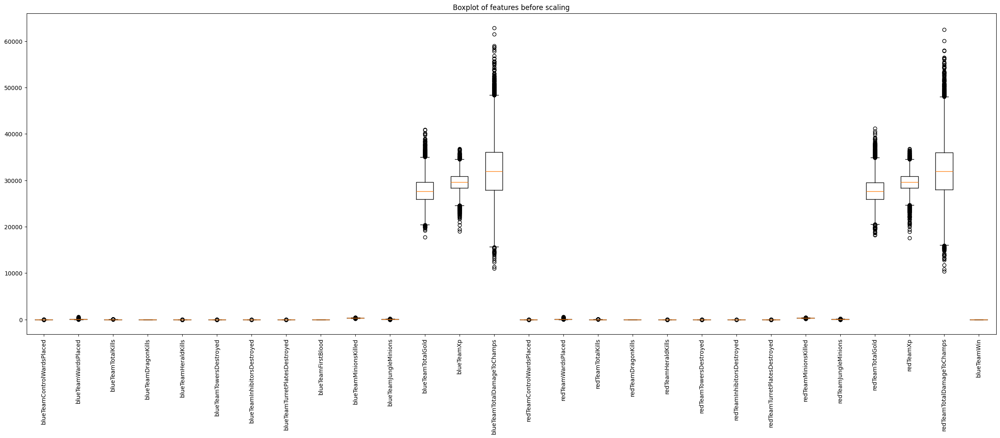

In [9]:
plt.figure(1, figsize=(30, 10))
plt.boxplot(df, tick_labels=df.columns)
plt.title("Boxplot of features before scaling")
plt.xticks(rotation=90)
plt.show()

In [10]:
big_value_cols = [
    "blueTeamTotalGold",
    "blueTeamXp",
    "blueTeamTotalDamageToChamps",
    "redTeamTotalGold",
    "redTeamXp",
    "redTeamTotalDamageToChamps"
]

cols_set = set(df.columns)
small_value_cols = list(cols_set - set(big_value_cols))

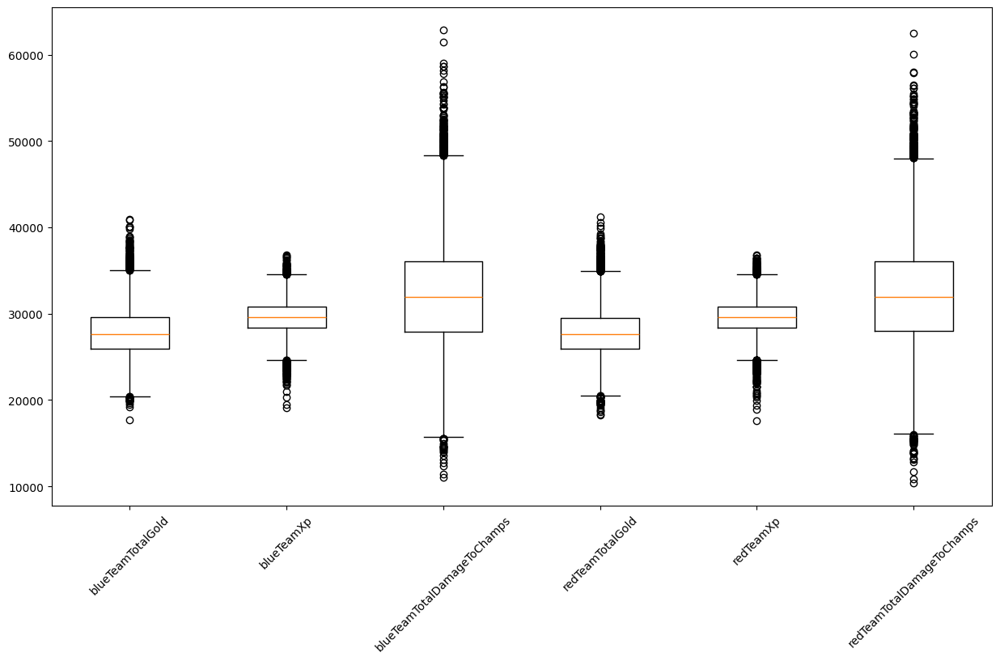

In [11]:
plt.figure(2, figsize=(15, 8))
plt.boxplot(df[big_value_cols], tick_labels=big_value_cols)
plt.xticks(rotation=45)
plt.show()

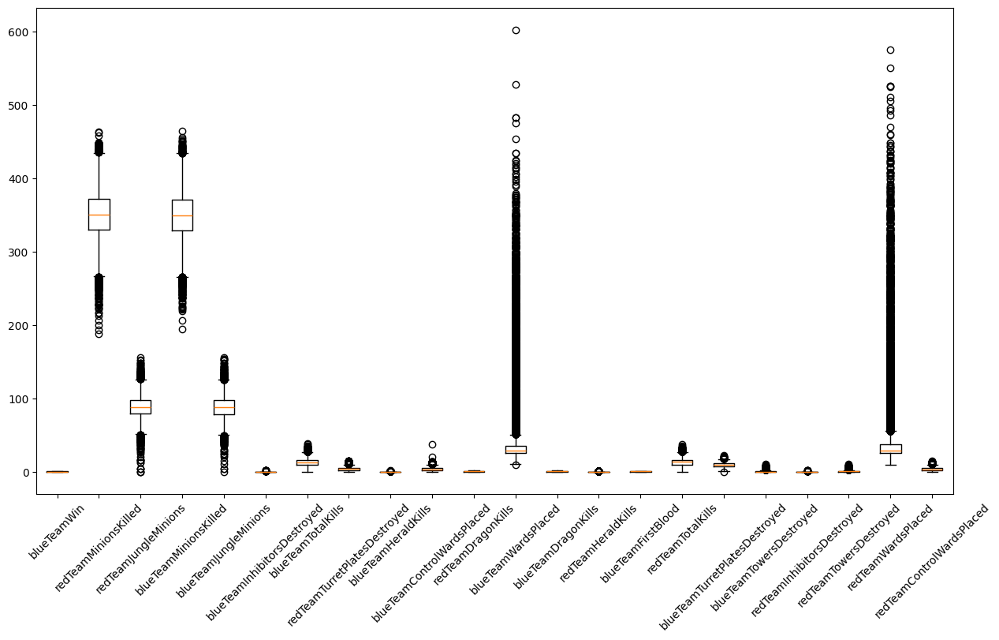

In [12]:
plt.figure(3, figsize=(15, 8))
plt.boxplot(df[small_value_cols], tick_labels=small_value_cols)
plt.xticks(rotation=45)
plt.show()

In [13]:
print(df["blueTeamInhibitorsDestroyed"].value_counts())
print(df["redTeamInhibitorsDestroyed"].value_counts())
print(df["blueTeamHeraldKills"].value_counts())
print(df["redTeamHeraldKills"].value_counts())

blueTeamInhibitorsDestroyed
0    24180
1       27
2       11
Name: count, dtype: int64
redTeamInhibitorsDestroyed
0    24186
1       27
2        5
Name: count, dtype: int64
blueTeamHeraldKills
0    21225
1     2992
2        1
Name: count, dtype: int64
redTeamHeraldKills
0    21720
1     2498
Name: count, dtype: int64


Ahora vamos a transformar estas variables. En una partida de LoL, no es importante el valor absoluto de casi ninguna de las variables, sino la diferencia entre equipos. Por ejemplo, es exactamente igual si el equipo azul tiene 5000 de oro y el rojo 3000, o si el azul tiene 20000 y el rojo 18000. En ambos casos, la diferencia es de 2000, y eso es lo que realmente importa. Por tanto, vamos a transformar las variables para quedarnos con la diferencia entre ambos equipos.  
Además, quitaremos las variables del inhibidores destruidos, ya que casi siempre son 0, y aunque destruir un inhibidor es importante, para los modelos que no sean árboles de decisión aportarán poco.  
Finalmente, quitaremos las variables de las placas de torretas y primera sangre, ya que solo aportan información sobre el oro obtenido, y ya tenemos las variables de oro.

De esta forma hacemos tres cosas:

1. Reducimos dimensionalidad, ya que eliminamos casi la mitad de las variables.
2. Reducimos escala de valores, ya que las diferencias son menores que los valores absolutos, aunque igual hay que escalar.
3. Eliminamos redundancia, ya que las variables de ambos equipos están altamente correlacionadas.


Utilizaremos el df completo para árboles de decisión y el df_compact para los demás modelos.


In [14]:
# Columnas diff (12 variables)
df["controlWardsPlacedDiff"] = df["blueTeamControlWardsPlaced"] - df["redTeamControlWardsPlaced"]
df["wardsPlacedDiff"] = df["blueTeamWardsPlaced"] - df["redTeamWardsPlaced"]
df["totalKillsDiff"] = df["blueTeamTotalKills"] - df["redTeamTotalKills"]
df["dragonKillsDiff"] = df["blueTeamDragonKills"] - df["redTeamDragonKills"]
df["heraldKillsDiff"] = df["blueTeamHeraldKills"] - df["redTeamHeraldKills"]
df["towersDestroyedDiff"] = df["blueTeamTowersDestroyed"] - df["redTeamTowersDestroyed"]
df["towerPlatesDestroyedDiff"] = df["blueTeamTurretPlatesDestroyed"] - df["redTeamTurretPlatesDestroyed"]
df["laneMinionsDiff"] = df["blueTeamMinionsKilled"] - df["redTeamMinionsKilled"]
df["jungleMinionsDiff"] = df["blueTeamJungleMinions"] - df["redTeamJungleMinions"]
df["totalGoldDiff"] = df["blueTeamTotalGold"] - df["redTeamTotalGold"]
df["xpDiff"] = df["blueTeamXp"] - df["redTeamXp"]
df["totalDamageToChampsDiff"] = df["blueTeamTotalDamageToChamps"] - df["redTeamTotalDamageToChamps"]

# Columnas de contexto (4 variables)
df["totalKills"] = df["blueTeamTotalKills"] + df["redTeamTotalKills"]  # Caos en la partida
df["totalTowersDestroyed"] = df["blueTeamTowersDestroyed"] + df["redTeamTowersDestroyed"]  # Avance en el mapa
df["totalWardsPlaced"] = df["blueTeamWardsPlaced"] + df["blueTeamControlWardsPlaced"] + \
    df["redTeamWardsPlaced"] + df["redTeamControlWardsPlaced"]  # Visión en el mapa
df["totalGold"] = df["blueTeamTotalGold"] + df["redTeamTotalGold"]  # Economía total

compact_cols = [
    "controlWardsPlacedDiff",
    "wardsPlacedDiff",
    "totalKillsDiff",
    "dragonKillsDiff",
    "heraldKillsDiff",
    "towersDestroyedDiff",
    "towerPlatesDestroyedDiff",
    "laneMinionsDiff",
    "jungleMinionsDiff",
    "totalGoldDiff",
    "xpDiff",
    "totalDamageToChampsDiff",
    "totalKills",
    "totalTowersDestroyed",
    "totalWardsPlaced",
    "totalGold",
    "blueTeamFirstBlood",
    "blueTeamWin"
]

df_compact = df[compact_cols]
df_compact.to_csv("./data/match_data_compact.csv", index=False)
df.to_csv("./data/match_data_full.csv", index=False)

df_without_gold = df_compact.drop(columns=["totalGoldDiff", "totalGold"])
df_without_gold.to_csv("./data/match_data_no_gold.csv", index=False)

df_compact.head()

,controlWardsPlacedDiff,wardsPlacedDiff,totalKillsDiff,dragonKillsDiff,heraldKillsDiff,towersDestroyedDiff,towerPlatesDestroyedDiff,laneMinionsDiff,jungleMinionsDiff,totalGoldDiff,xpDiff,totalDamageToChampsDiff,totalKills,totalTowersDestroyed,totalWardsPlaced,totalGold,blueTeamFirstBlood,blueTeamWin
0,-4,-11,-12,2,0,-2,6,-12,12,-5714,-2815,-5397,20,2,65,53560,0,1
1,-4,20,-5,1,0,0,6,-25,22,-1118,210,-768,29,2,80,56822,0,0
2,-1,-222,-5,-1,0,-2,8,-9,12,-2384,37,-4945,31,2,265,58636,0,0
3,3,5,-2,-1,1,1,4,-23,-3,2176,-603,3109,18,1,54,52490,1,0
4,-4,4,4,0,1,0,2,-12,4,1720,1591,7431,18,2,66,53824,0,1


Ahora solo queda utilizar los modelos con estos datos. Hay que usar RobustScaler para escalar los datos, pero eso se implementará en el momento de usar los modelos mediante un Pipeline.

## Decision Tree

In [15]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import RobustScaler

In [16]:
df = pd.read_csv("data/match_data_full.csv")

X = df.drop(columns=["blueTeamWin"])
y = df["blueTeamWin"]

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.4, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_val, y_val, test_size=0.5, random_state=42)

dt = DecisionTreeClassifier(random_state=42)

param_grid = {
    "criterion": ["gini", "entropy"],
    "max_depth": [5, 10],
    "min_samples_leaf": [5, 10, 20]
}

grid_search = GridSearchCV(
    estimator=dt,
    param_grid=param_grid,
    cv=5,
    n_jobs=-1,
    scoring='accuracy'
)

grid_search.fit(X_train, y_train)

best_dt = grid_search.best_estimator_
print("Mejores parámetros:", grid_search.best_params_)
print("Mejor puntuación de validación cruzada:", grid_search.best_score_)

Mejores parámetros: {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 5}
Mejor puntuación de validación cruzada: 0.7578114246386787


In [17]:
y_pred = best_dt.predict(X_val)

print("Matriz de confusión:")
print(confusion_matrix(y_val, y_pred))
print("\nInforme de clasificación:")
print(classification_report(y_val, y_pred, target_names=["Red Team Win", "Blue Team Win"]))

Matriz de confusión:
[[1900  535]
 [ 699 1710]]

Informe de clasificación:
               precision    recall  f1-score   support

 Red Team Win       0.73      0.78      0.75      2435
Blue Team Win       0.76      0.71      0.73      2409

     accuracy                           0.75      4844
    macro avg       0.75      0.75      0.74      4844
 weighted avg       0.75      0.75      0.74      4844



In [18]:
importancia = pd.DataFrame({
    'Feature': X.columns,
    'Importance': best_dt.feature_importances_
}).sort_values(by='Importance', ascending=False)

print("\nTop 5 Variables más importantes:")
importancia.head(5)


Top 5 Variables más importantes:


,Feature,Importance
36,totalGoldDiff,0.906648
30,dragonKillsDiff,0.047862
37,xpDiff,0.027521
24,redTeamTotalGold,0.004016
16,redTeamTotalKills,0.003784


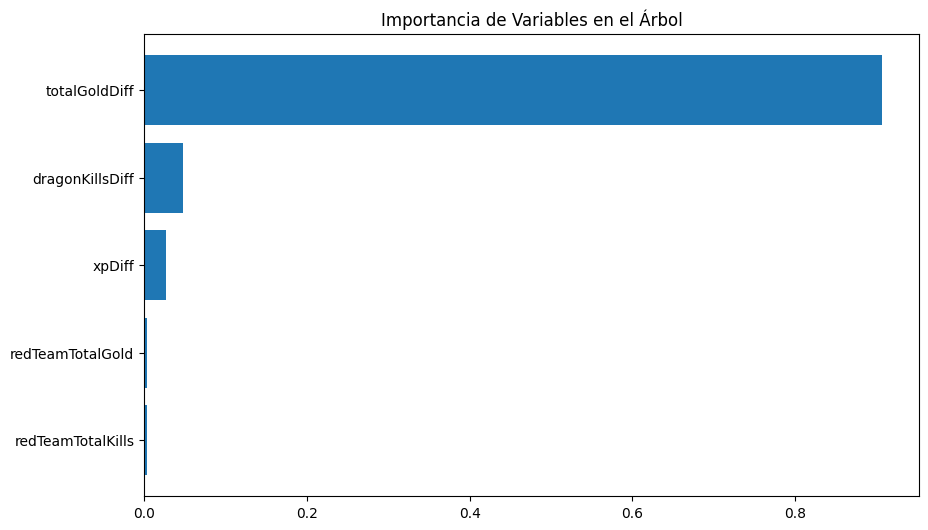

In [19]:
plt.figure(figsize=(10, 6))
plt.barh(importancia['Feature'][:5], importancia['Importance'][:5])
plt.gca().invert_yaxis()
plt.title("Importancia de Variables en el Árbol")
plt.show()

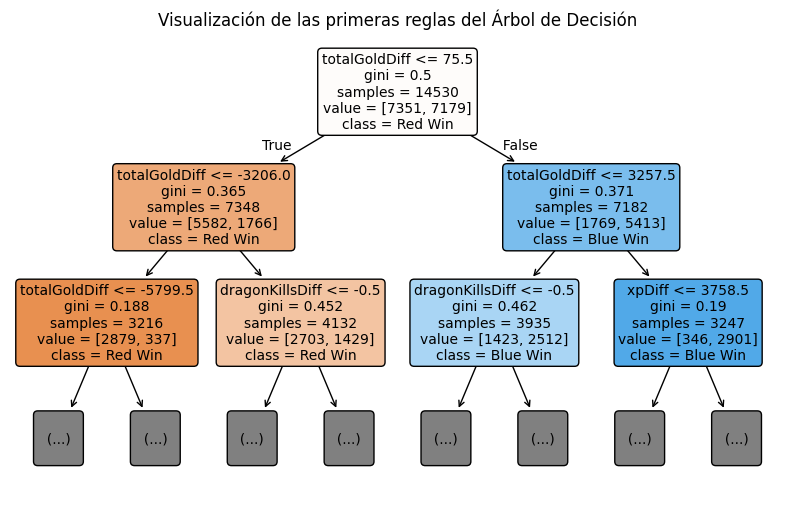

In [20]:
plt.figure(figsize=(10, 6))
plot_tree(best_dt,
          feature_names=X.columns,
          class_names=['Red Win', 'Blue Win'],
          filled=True,
          rounded=True,
          max_depth=2,
          fontsize=10)
plt.title("Visualización de las primeras reglas del Árbol de Decisión")
plt.show()

In [21]:
import shap

# Seleccionamos una muestra del conjunto de test para acelerar el cálculo de SHAP
sample_data = shap.sample(X_val, 50, random_state=0)

# Obtenemos el explainer SHAP
explainer = shap.TreeExplainer(best_dt, sample_data)

# Calculamos los valores SHAP para el conjunto de test
instance = X_val.iloc[[0]]
shap_values = explainer.shap_values(instance)

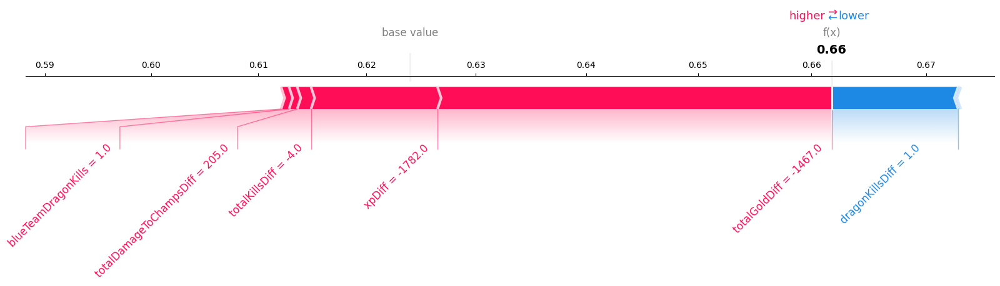

In [22]:
# Visualizamos los valores SHAP
shap.initjs()
shap.force_plot(
    explainer.expected_value[0],
    shap_values[0][:, 0],
    instance.iloc[0],
    matplotlib=True,
    text_rotation=45,
    link="logit"
)

In [23]:
shap_values_summary = explainer.shap_values(sample_data)

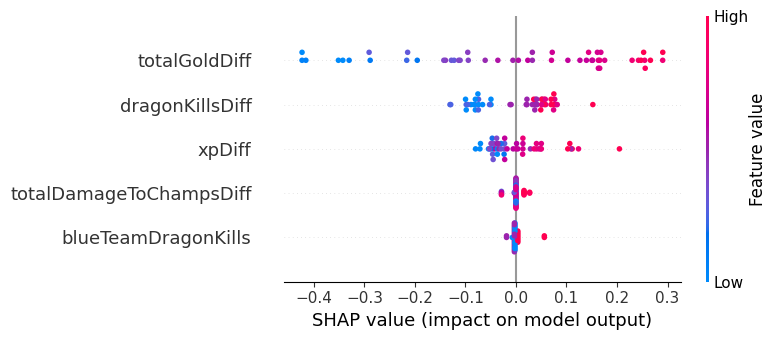

In [24]:
plt.figure(dpi=100)
shap.summary_plot(
    shap_values_summary[:, :, 1],
    sample_data,
    max_display=5,
    plot_type="dot",
    show=False
)

## SVM

In [25]:
from sklearn.svm import SVC, LinearSVC

In [26]:

import plotly.graph_objects as go
import plotly.io as pio

try:
    import google.colab
    pio.renderers.default = 'colab'
    print("Entorno detectado: Google Colab. Renderizador configurado como 'colab'.")
except ImportError:
    pio.renderers.default = 'notebook'
    print("Entorno detectado: Local (jupyter). Renderizador configurado como 'notebook'.")


Entorno detectado: Local (jupyter). Renderizador configurado como 'notebook'.


In [27]:
df = pd.read_csv("data/match_data_compact.csv")

scaler = RobustScaler().set_output(transform="pandas")
X = df.drop(columns=["blueTeamWin"])
X = scaler.fit_transform(X)
y = df["blueTeamWin"]
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.4, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_val, y_val, test_size=0.5, random_state=42)

In [28]:
import time
start = time.time()

dt = SVC(random_state = 42)

param_grid = [
    {
        'kernel': ['linear', 'rbf', 'sigmoid'],
        'C': [0.1, 1, 10]
    },
    {
        'kernel': ['poly'],
        'C': [ 0.1, 1,10],
        'degree': [2, 5] 
    }
]

grid_search = GridSearchCV(estimator = dt,
                    param_grid = param_grid,
                    n_jobs=-1,
                    cv = 4,
                    scoring='accuracy')


grid_search.fit(X_train, y_train)

best_dt = grid_search.best_estimator_
print("Mejores parámetros:", grid_search.best_params_)
print("Mejor puntuación de validación cruzada:", grid_search.best_score_)
print(time.time()-start)

Mejores parámetros: {'C': 0.1, 'kernel': 'linear'}
Mejor puntuación de validación cruzada: 0.7642121602212223
124.92210793495178


In [29]:
model = grid_search.best_estimator_
y_pred = model.predict(X_val)

print("Matriz de confusión:")
print(confusion_matrix(y_val, y_pred))
print("\nInforme de clasificación:")
print(classification_report(y_val, y_pred))

Matriz de confusión:
[[1821  614]
 [ 603 1806]]

Informe de clasificación:
              precision    recall  f1-score   support

           0       0.75      0.75      0.75      2435
           1       0.75      0.75      0.75      2409

    accuracy                           0.75      4844
   macro avg       0.75      0.75      0.75      4844
weighted avg       0.75      0.75      0.75      4844



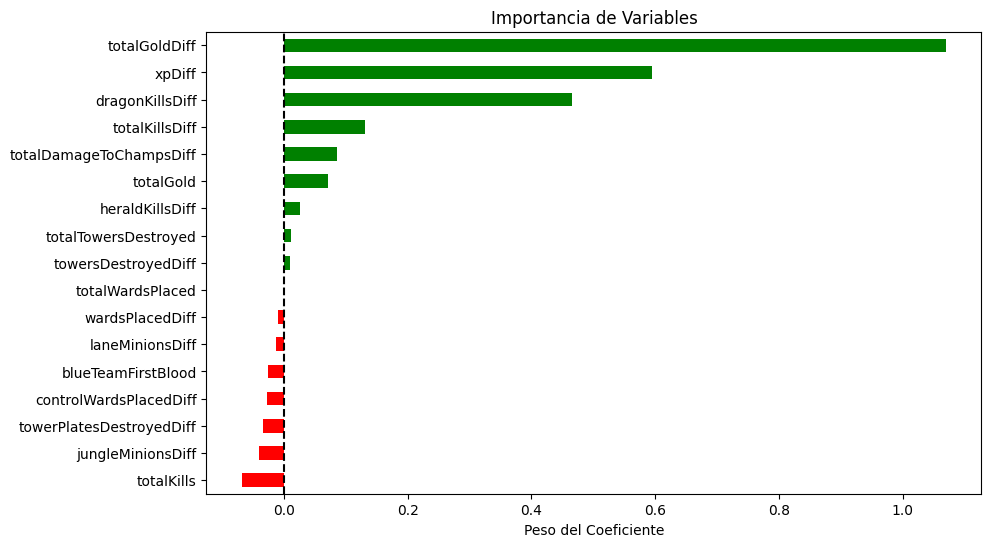

In [30]:
coeficientes = (best_dt.coef_.flatten())
feat_imp = pd.Series(coeficientes, index=X_train.columns).sort_values()
plt.figure(figsize=(10, 6))
feat_imp.plot(kind='barh', color=np.where(feat_imp > 0, 'green', 'red'))
plt.title("Importancia de Variables")
plt.xlabel("Peso del Coeficiente")
plt.axvline(x=0, color='black', linestyle='--') 
plt.show()

In [31]:
df_ng = pd.read_csv("data/match_data_no_gold.csv")

scaler = RobustScaler().set_output(transform="pandas")
X_ng = df_ng.drop(columns=["blueTeamWin"])
X_ng = scaler.fit_transform(X_ng)
y = df_ng["blueTeamWin"]
X_train, X_val, y_train, y_val = train_test_split(X_ng, y, test_size=0.4, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_val, y_val, test_size=0.5, random_state=42)
start = time.time()

dt = SVC(random_state = 42)

param_grid = [
    {
        'kernel': ['linear', 'rbf'],
        'C': [0.1, 1, 10]
    },
    {
        'kernel': ['poly'],
        'C': [ 0.1, 1,10],
        'degree': [2, 5] 
    }
]

grid_search = GridSearchCV(estimator = dt,
                    param_grid = param_grid,
                    n_jobs=-1,
                    cv = 4,
                    scoring='accuracy')


grid_search.fit(X_train, y_train)

best_dt = grid_search.best_estimator_
print("Mejores parámetros:", grid_search.best_params_)
print("Mejor puntuación de validación cruzada:", grid_search.best_score_)
print(time.time()-start)

Mejores parámetros: {'C': 1, 'kernel': 'linear'}
Mejor puntuación de validación cruzada: 0.7611842458266187
190.33294868469238


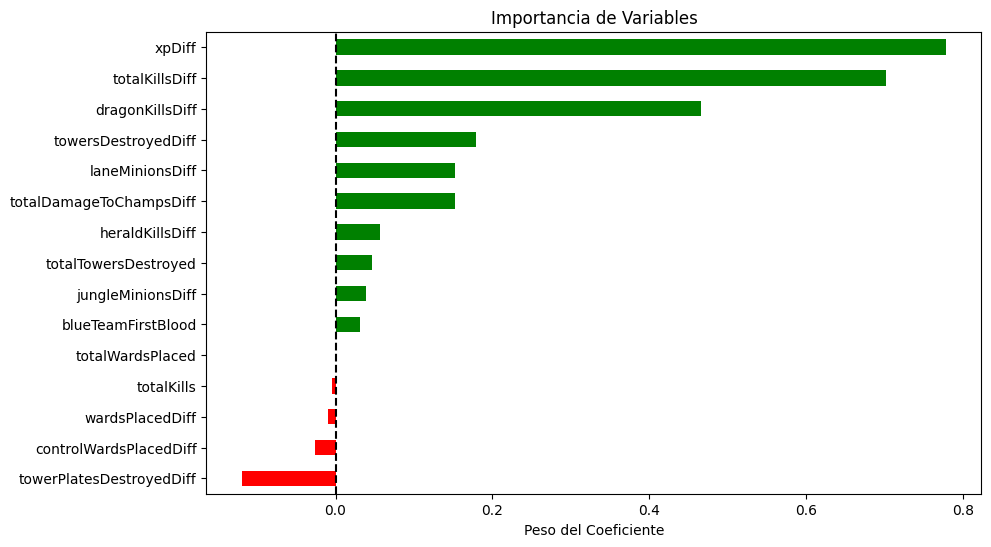

In [32]:
coeficientes = (best_dt.coef_.flatten())
b = best_dt.intercept_[0]
feat_imp = pd.Series(coeficientes, index=X_train.columns).sort_values()
plt.figure(figsize=(10, 6))
feat_imp.plot(kind='barh', color=np.where(feat_imp > 0, 'green', 'red'))
plt.title("Importancia de Variables")
plt.xlabel("Peso del Coeficiente")
plt.axvline(x=0, color='black', linestyle='--') 
plt.show()

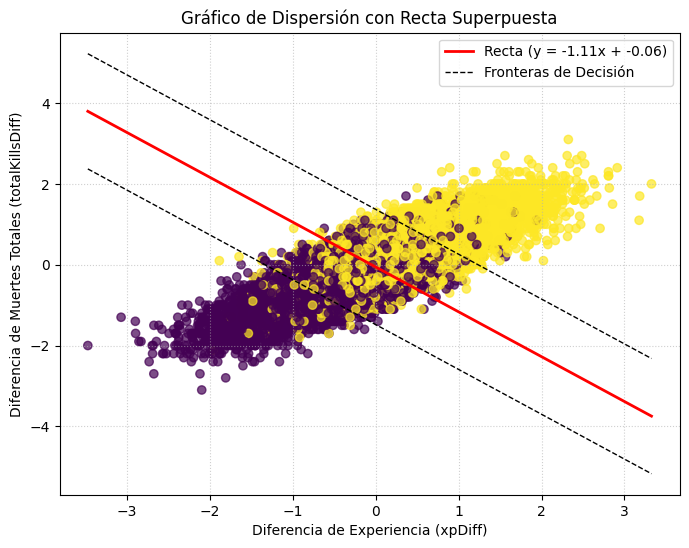

In [33]:

np.random.seed(42)

plt.figure(figsize=(8, 6))
scatter = plt.scatter(X["xpDiff"], X["totalKillsDiff"], c=y, cmap='viridis', alpha=0.7)


intercept = b
w0 = coeficientes[9] #coeficiente asociado a xpdiff
w1 = coeficientes[2] #coeficiente asociado a totalKillsDiff
M = - w0/w1
B = -intercept / w1
norm_w = np.linalg.norm(coeficientes[0])
distancia_a_frontera = 1 / norm_w
anchura_del_margen = 2 * distancia_a_frontera
x_min = X_ng["xpDiff"].min()
x_max = X_ng["xpDiff"].max()


x_line = np.linspace(x_min, x_max, 100)

y_line = M * x_line + B

y_up = M * x_line + B + (1 / w1)


y_down = M * x_line + B - (1 / w1)

margin_offset = distancia_a_frontera / w1

plt.plot(x_line, y_line, color='red', linewidth=2, label=f'Recta (y = {M:.2f}x + {B:.2f})')
plt.plot(x_line, y_up, color='k', linestyle='--', linewidth=1, label='Fronteras de Decisión')
plt.plot(x_line, y_down, color='k', linestyle='--', linewidth=1)


plt.xlabel("Diferencia de Experiencia (xpDiff)")
plt.ylabel("Diferencia de Muertes Totales (totalKillsDiff)")
plt.title("Gráfico de Dispersión con Recta Superpuesta")
plt.legend()
plt.grid(True, linestyle=':', alpha=0.6)
plt.show()

### Proyección del Hiperplano SVM a 2D

Para pasar el hiperplano de SVM de $N$-dimensiones a una recta visualizable en 2D, partimos de la ecuación general del hiperplano:

$$w_1 x_1 + w_2 x_2 + \dots + w_n x_n + b = 0$$

Para simplificar a 2D, tomamos los **promedios** (o valores centrales) de las variables que no vamos a graficar $\{x_3, x_4, \dots, x_n\}$. Definimos un nuevo sesgo efectivo $B'$ que agrupa estos términos constantes:

$$B' = b + \sum_{i=3}^{n} w_i \cdot \bar{x}_i$$

Dado que hemos escalado los datos con **RobustScaler** , asumimos que el valor central de estas variables es **0**. Por lo tanto, el término de la sumatoria se anula y obtenemos que $b \approx B'$ (No es exactamente 0 porque resta la mediana y no la media). La ecuación reducida para el plano 2D queda:

$$w_1 x_1 + w_2 x_2 + b = 0$$

Para obtener la ecuación de la recta (forma $y = mx + c$), despejamos la segunda variable ($x_2$):

$$x_2 = -\frac{w_1}{w_2} x_1 - \frac{b}{w_2}$$

Finalmente, para calcular las **rectas de las fronteras (márgenes)**, imponemos la condición de margen $ = 1$ y $ = -1$. Esto equivale a sumar y restar una unidad al término independiente de la ecuación original, lo que se traduce en un desplazamiento vertical en la recta final:

$$x_2 = -\frac{w_1}{w_2} x_1 - \frac{b \pm 1}{w_2}$$

Es decir, sumamos y restamos el término $\frac{1}{w_2}$ a la recta de decisión.

In [34]:

variables = pd.Series(["xpDiff","totalKillsDiff","dragonKillsDiff"])
w = coeficientes[[9,2,3]]
M0 = -w[0] / w[2]
M1 = -w[1] / w[2]
B = -b/w[2]
fig = go.Figure()
dist = 1 / w[2]

fig.add_trace(go.Scatter3d(
    x=X_ng[variables[0]],
    y=X_ng[variables[1]],
    z=X_ng[variables[2]],
    opacity=0.8,
    mode='markers',
    marker=dict(size=5, color=y, colorscale='Viridis'),
    name='Data'
))

x_min, x_max = -1, 1
y_min, y_max = -1, 1
x_range = np.linspace(x_min, x_max, 50)
y_range = np.linspace(y_min, y_max, 50)
X_grid, Y_grid = np.meshgrid(x_range, y_range)
Z_grid = M0 * X_grid + M1 * Y_grid + B

z2 = Z_grid + dist
z3 = Z_grid - dist


fig.add_trace(
    go.Surface(
        x=X_grid,
        y=Y_grid,
        z=Z_grid,
        name='Hiperplano Separador',
        opacity=0.7,          
        showscale=False,       
        colorscale=[[0, 'red'], [1, 'red']] 
    )
)

fig.update_layout(
    scene=dict(
        xaxis_title=variables[0],
        yaxis_title=variables[1],
        zaxis_title=variables[2],
    ),
    title='Scatter Plot',
    margin=dict(l=0, r=0, b=0, t=40)
)
fig.show()



In [35]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) 
                       for i in range(len(X.columns))]

vif_data

,Variable,VIF
0,controlWardsPlacedDiff,1.048429
1,wardsPlacedDiff,1.012280
2,totalKillsDiff,10.566067
3,dragonKillsDiff,1.218669
4,heraldKillsDiff,1.086991
5,towersDestroyedDiff,2.475315
6,towerPlatesDestroyedDiff,2.118567
7,laneMinionsDiff,2.963087
8,jungleMinionsDiff,1.658089
9,totalGoldDiff,19.782145


In [36]:
columnas = X.columns
maxim = fila_max = vif_data[vif_data['VIF'] == vif_data['VIF'].max()]
while maxim["VIF"].iloc[0] > 5:
    print(maxim["Variable"])
    columnas = columnas[columnas!=maxim["Variable"].iloc[0]]
    vif_data = pd.DataFrame()
    vif_data["Variable"] = columnas
    vif_data["VIF"] = [variance_inflation_factor(X[columnas].values, i) 
                       for i in range(len(columnas))]
    maxim = fila_max = vif_data[vif_data['VIF'] == vif_data['VIF'].max()]

    

9    totalGoldDiff
Name: Variable, dtype: object
9    xpDiff
Name: Variable, dtype: object
13    totalGold
Name: Variable, dtype: object


In [37]:
X_proc = df[vif_data["Variable"]]
X_proc = scaler.fit_transform(X_proc)


X_train, X_val, y_train, y_val = train_test_split(X_proc, y, test_size=0.4, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_val, y_val, test_size=0.5, random_state=42)

In [38]:


start = time.time()

dt = SVC(random_state = 42)
dt2 = LinearSVC(random_state=42)
par = {'C':[0.1,1,10,1000,500,10000]}
param_grid = [
    {
        'kernel': ['linear', 'rbf'],
        'C': [0.1, 1, 10,100]
    },
    {
        'kernel': ['poly'],
        'C': [ 1],
        'degree': [2 ] 
    }
]

grid_search = GridSearchCV(estimator = dt,
                    param_grid = param_grid,
                    n_jobs=-1,
                    cv = 5,
                    scoring='accuracy')


grid_search.fit(X_train, y_train)

best_dt = grid_search.best_estimator_
print("Mejores parámetros:", grid_search.best_params_)
print("Mejor puntuación de validación cruzada:", grid_search.best_score_)
print(time.time()-start)


Mejores parámetros: {'C': 10, 'kernel': 'linear'}
Mejor puntuación de validación cruzada: 0.7602202339986235
208.50095009803772


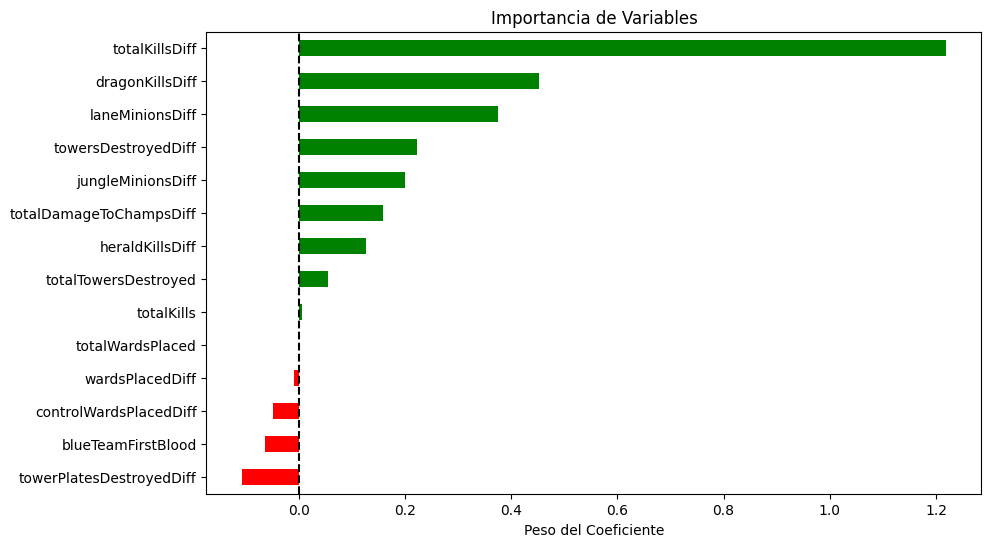

In [39]:
coeficientes = (best_dt.coef_.flatten())
b = best_dt.intercept_[0]
feat_imp = pd.Series(coeficientes, index=X_train.columns).sort_values()
plt.figure(figsize=(10, 6))
feat_imp.plot(kind='barh', color=np.where(feat_imp > 0, 'green', 'red'))
plt.title("Importancia de Variables")
plt.xlabel("Peso del Coeficiente")
plt.axvline(x=0, color='black', linestyle='--') 
plt.show()

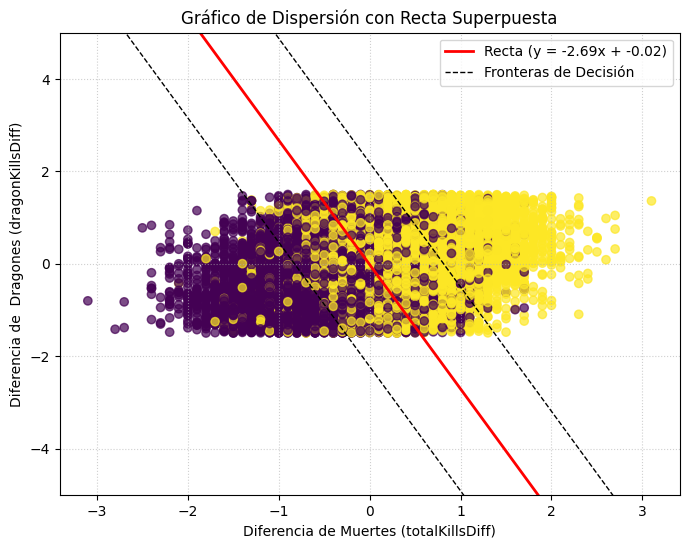

In [40]:


np.random.seed(42)

plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_proc["totalKillsDiff"], X_proc["dragonKillsDiff"] + (np.random.rand(X_proc.shape[0])-0.5), c=y, cmap='viridis', alpha=0.7)


w0 = coeficientes[2] 
w1 = coeficientes[3]
M = - w0/w1
B = -b / w1
norm_w = np.linalg.norm(coeficientes)
distancia_a_frontera = 1 / norm_w
anchura_del_margen = 2 * distancia_a_frontera
x_min = X_proc["totalKillsDiff"].min()
x_max = X_proc["totalKillsDiff"].max()


x_line = np.linspace(x_min, x_max, 100)

y_line = M * x_line + B

y_up = M * x_line + B + (1 / w1)


y_down = M * x_line + B - (1 / w1)

margin_offset = distancia_a_frontera / w1

plt.plot(x_line, y_line, color='red', linewidth=2, label=f'Recta (y = {M:.2f}x + {B:.2f})')
plt.plot(x_line, y_up, color='k', linestyle='--', linewidth=1, label='Fronteras de Decisión')
plt.plot(x_line, y_down, color='k', linestyle='--', linewidth=1)


plt.xlabel("Diferencia de Muertes (totalKillsDiff)")
plt.ylabel("Diferencia de  Dragones (dragonKillsDiff)")
plt.title("Gráfico de Dispersión con Recta Superpuesta")
plt.legend()
plt.grid(True, linestyle=':', alpha=0.6)
plt.ylim((-5,5))
plt.show()

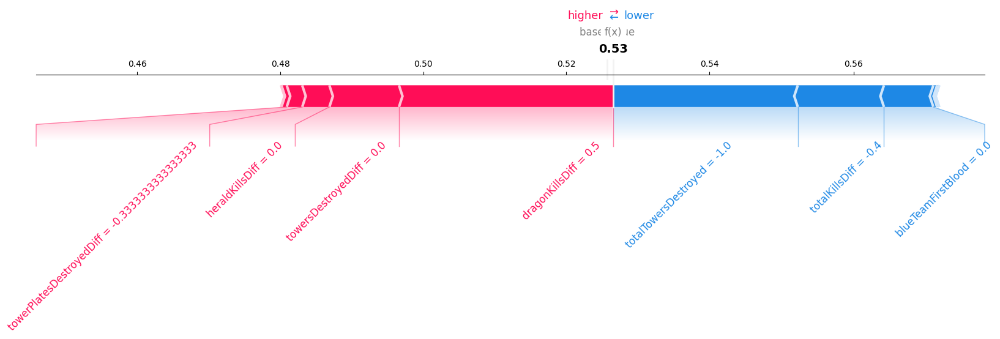

In [41]:
# 1. Extraer las piezas del Pipeline
# 2. Preparar los datos CORRECTOS (Escalados) para el Explainer
# Tomamos la muestra cruda y la escalamos
sample_data_raw = shap.sample(X_val, 50, random_state=0)
sample_data_scaled = scaler.transform(sample_data_raw)

# Tomamos la instancia cruda y la escalamos
instance_raw = X_val.iloc[[0]]  # DataFrame (crudo)
instance_scaled = scaler.transform(instance_raw)  # Numpy Array (escalado)

# 3. Crear el Explainer con datos ESCALADOS
# Ahora el modelo recibe lo que espera (números pequeños)
explainer = shap.LinearExplainer(best_dt, sample_data_scaled)

# 4. Calcular SHAP values sobre la instancia ESCALADA
shap_values = explainer.shap_values(instance_scaled)

shap.initjs()
shap.force_plot(
    explainer.expected_value,
    shap_values[0],
    instance_raw.iloc[0],
    matplotlib=True,
    text_rotation=45,
    link="logit"
)

## Regresión Logística


In [42]:
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression

Mejor C: 0.1
Mejor accuracy en CV: 0.7658
Matriz de Confusión:
[[1815  620]
 [ 597 1812]]

Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.75      0.75      0.75      2435
           1       0.75      0.75      0.75      2409

    accuracy                           0.75      4844
   macro avg       0.75      0.75      0.75      4844
weighted avg       0.75      0.75      0.75      4844


Importancia de las variables (Pesos):
                    Variable  Coeficiente
9              totalGoldDiff     1.252559
10                    xpDiff     0.685477
3            dragonKillsDiff     0.540653
2             totalKillsDiff     0.205960
11   totalDamageToChampsDiff     0.112156
15                 totalGold     0.094808
12                totalKills    -0.088710
6   towerPlatesDestroyedDiff    -0.047508
5        towersDestroyedDiff     0.046581
4            heraldKillsDiff     0.037067
0     controlWardsPlacedDiff    -0.033187
8          ju

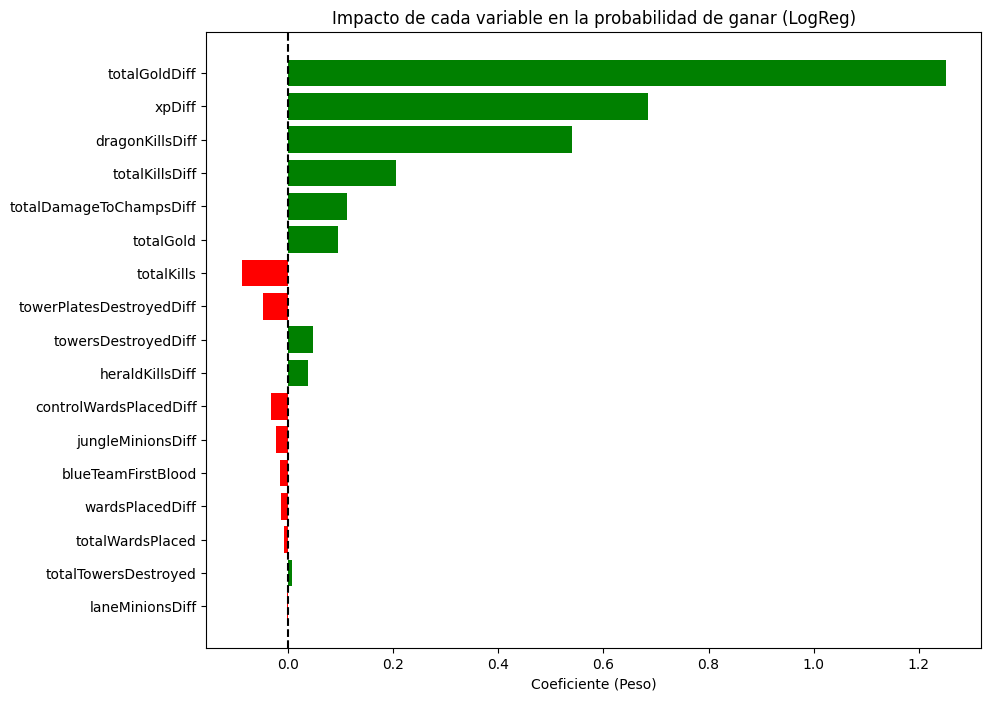

In [43]:
X = df.drop("blueTeamWin", axis=1)
y = df["blueTeamWin"]

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.4, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_val, y_val, test_size=0.5, random_state=42)
pipeline = Pipeline([
    ("scaler", RobustScaler()),
    ("logreg", LogisticRegression(max_iter=1000))
])

param_grid = {
    "logreg__C": [0.01, 0.1, 1, 2, 10]
}

grid_search = GridSearchCV(pipeline, param_grid, cv=5, n_jobs=-1, scoring='accuracy')
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_

print(f"Mejor C: {grid_search.best_params_['logreg__C']}")
print(f"Mejor accuracy en CV: {grid_search.best_score_:.4f}")

y_pred = best_model.predict(X_val)
print("Matriz de Confusión:")
print(confusion_matrix(y_val, y_pred))
print("\nReporte de Clasificación:")
print(classification_report(y_val, y_pred))

# Extraer el modelo y los nombres de columnas
model_logreg = best_model.named_steps['logreg']
coeficientes = model_logreg.coef_[0]
nombres_cols = X.columns

# Crear DataFrame de coeficientes
df_coefs = pd.DataFrame({
    'Variable': nombres_cols,
    'Coeficiente': coeficientes,
    'Abs_Coef': abs(coeficientes)  # Para ordenar por magnitud
}).sort_values(by='Abs_Coef', ascending=False)

print("\nImportancia de las variables (Pesos):")
print(df_coefs[['Variable', 'Coeficiente']])

# Gráfico de Coeficientes
plt.figure(figsize=(10, 8))
# Colorear: Verde si es positivo (ayuda a Blue), Rojo si es negativo
colors = ['green' if c > 0 else 'red' for c in df_coefs['Coeficiente']]
plt.barh(df_coefs['Variable'], df_coefs['Coeficiente'], color=colors)
plt.title("Impacto de cada variable en la probabilidad de ganar (LogReg)")
plt.xlabel("Coeficiente (Peso)")
plt.axvline(x=0, color='black', linestyle='--')  # Línea central
plt.gca().invert_yaxis()  # Invertir eje Y para ver las más importantes arriba
plt.show()

In [81]:
df = pd.read_csv("data/match_data_no_gold.csv")

X = df.drop("blueTeamWin", axis=1)
y = df["blueTeamWin"]

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.4, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_val, y_val, test_size=0.5, random_state=42)

pipeline = Pipeline([
    ("scaler", RobustScaler()),
    ("logreg", LogisticRegression(max_iter=1000))
])


In [82]:
param_grid = {
    "logreg__C": [0.01, 0.1, 1, 10]
}

grid_search = GridSearchCV(pipeline, param_grid, cv=5, n_jobs=-1, scoring='accuracy')
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_
log_model = best_model
print(f"Mejor C: {grid_search.best_params_['logreg__C']}")
print(f"Mejor accuracy en CV: {grid_search.best_score_:.4f}")

Mejor C: 10
Mejor accuracy en CV: 0.7617


In [83]:
y_pred = best_model.predict(X_val)

print("Matriz de Confusión:")
print(confusion_matrix(y_val, y_pred))
print("\nReporte de Clasificación:")
print(classification_report(y_val, y_pred))

Matriz de Confusión:
[[1820  615]
 [ 615 1794]]

Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.75      0.75      0.75      2435
           1       0.74      0.74      0.74      2409

    accuracy                           0.75      4844
   macro avg       0.75      0.75      0.75      4844
weighted avg       0.75      0.75      0.75      4844




Importancia de las variables (Pesos):
                    Variable  Coeficiente
9                     xpDiff     0.904537
2             totalKillsDiff     0.859503
3            dragonKillsDiff     0.524922
5        towersDestroyedDiff     0.241865
10   totalDamageToChampsDiff     0.181952
7            laneMinionsDiff     0.180594
6   towerPlatesDestroyedDiff    -0.156623
4            heraldKillsDiff     0.068236
8          jungleMinionsDiff     0.058715
12      totalTowersDestroyed     0.049471
14        blueTeamFirstBlood     0.041951
0     controlWardsPlacedDiff    -0.038703
1            wardsPlacedDiff    -0.014224
13          totalWardsPlaced    -0.007622
11                totalKills    -0.004330


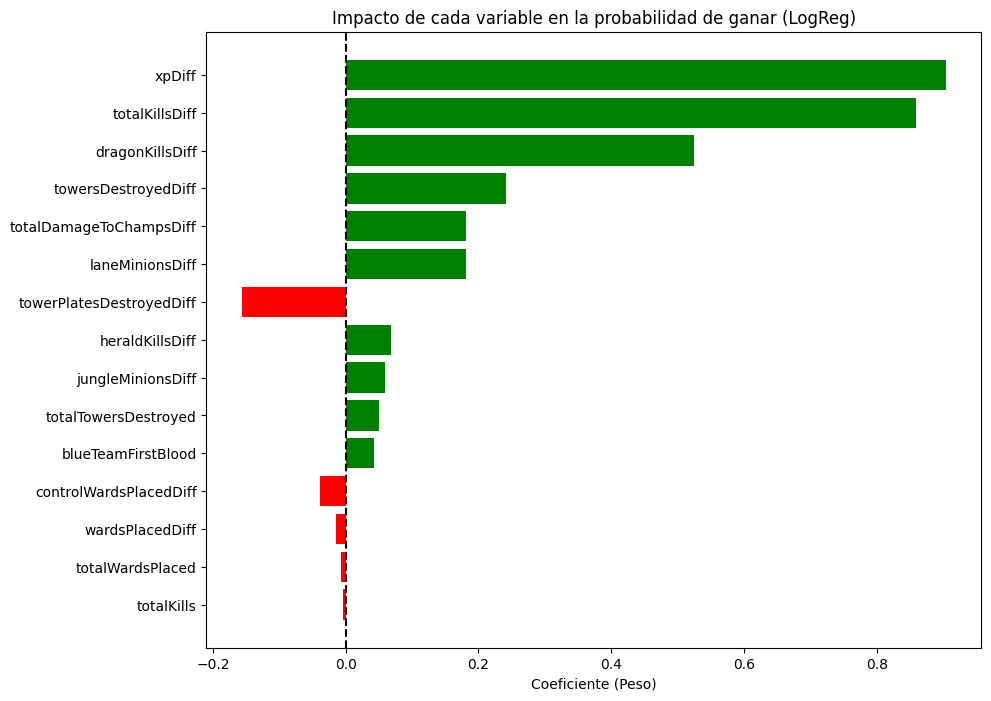

In [47]:
# Extraer el modelo y los nombres de columnas
model_logreg = best_model.named_steps['logreg']
coeficientes = model_logreg.coef_[0]
intercept = model_logreg.intercept_[0]
nombres_cols = X.columns

# Crear DataFrame de coeficientes
df_coefs = pd.DataFrame({
    'Variable': nombres_cols,
    'Coeficiente': coeficientes,
    'Abs_Coef': abs(coeficientes)  # Para ordenar por magnitud
}).sort_values(by='Abs_Coef', ascending=False)

print("\nImportancia de las variables (Pesos):")
print(df_coefs[['Variable', 'Coeficiente']])

# Gráfico de Coeficientes
plt.figure(figsize=(10, 8))
# Colorear: Verde si es positivo (ayuda a Blue), Rojo si es negativo
colors = ['green' if c > 0 else 'red' for c in df_coefs['Coeficiente']]
plt.barh(df_coefs['Variable'], df_coefs['Coeficiente'], color=colors)
plt.title("Impacto de cada variable en la probabilidad de ganar (LogReg)")
plt.xlabel("Coeficiente (Peso)")
plt.axvline(x=0, color='black', linestyle='--')  # Línea central
plt.gca().invert_yaxis()  # Invertir eje Y para ver las más importantes arriba
plt.show()

In [48]:
from scipy.special import expit
X_scaled = RobustScaler().set_output(transform="pandas").fit_transform(X_train)

x = X_scaled["totalKillsDiff"]
y = X_scaled["xpDiff"]

b0 = np.sort(coeficientes)[-1]
b1 = np.sort(coeficientes)[-2]
x_range = np.linspace(x.min(), x.max(),100)
y_range = np.linspace(y.min(), y.max(),100)
xx, yy = np.meshgrid(x_range, y_range)

zz = expit(intercept + b0*xx + b1*yy)
plan = zz/zz * 0.5




linea_x = np.linspace(x.min(), x.max(), 100)
linea_y = -(intercept + b0 * linea_x) / b1
linea_z = np.full_like(linea_x, 0.5) 

puntos_x=linea_x[::10]
puntos_y=linea_y[::10]
line_z = np.linspace(0,0.5,100)
fig = go.Figure()


#Puntos de los datos
fig.add_trace(go.Scatter3d(
    x=x,
    y=y,
    z=y_train,
    opacity=0.8,
    mode='markers',
    marker=dict(size=5, color=y_train, colorscale='Viridis'),
    name='Data'
))


#Superficie función logística
fig.add_trace(
    go.Surface(
        x=xx,
        y=yy,
        z=zz,
        name='Logreg',
        opacity=0.7,          
        showscale=False,       
        colorscale='viridis'
    )
)

#Plano horizontal
fig.add_trace(
    go.Surface(
        x=xx,
        y=yy,
        z=plan,
        name='Hiperplano z=0.5',
        opacity=0.7,          
        showscale=False,       
        colorscale='viridis',
    ),
   
)
#Líneas verticales proyecciones
for i in range(len(puntos_x)):
    line_x = np.ones_like(line_z)*puntos_x[i]
    line_y = np.ones_like(line_z)*puntos_y[i]
    fig.add_trace(go.Scatter3d(
        x=line_x,
        y=line_y,
        z=line_z,
        mode='lines',
        line=dict(color='black', width=5, dash='dash'), # Línea punteada negra
        showlegend=False
    ))

#Interseccion
fig.add_trace(go.Scatter3d(
    x=linea_x,
    y=linea_y,
    z=linea_z, 
    mode='lines',
    line=dict(color='black', width=5, dash='dash'), # Línea punteada negra
    name='Interseccion'
))

#Proyeccion de la interseccion
fig.add_trace(go.Scatter3d(
    x=linea_x,
    y=linea_y,
    z=np.zeros_like(linea_x), 
    mode='lines',
    line=dict(color='black', width=5, dash='dash'), 
    showlegend=False
))

fig.add_trace(go.Scatter3d(
    x=puntos_x,
    y=puntos_y,
    z=np.zeros_like(puntos_x), 
    mode='markers',
    marker=dict(size=5, color='red'),
    name='Frontera de predicción'
))

fig.update_layout(
    scene=dict(
        xaxis_title="totalKillsDiff",
        yaxis_title="xpDiff",
        zaxis_title="target",
    ),
    title='Scatter Plot',
    margin=dict(l=0, r=0, b=0, t=40)
)
fig.show()



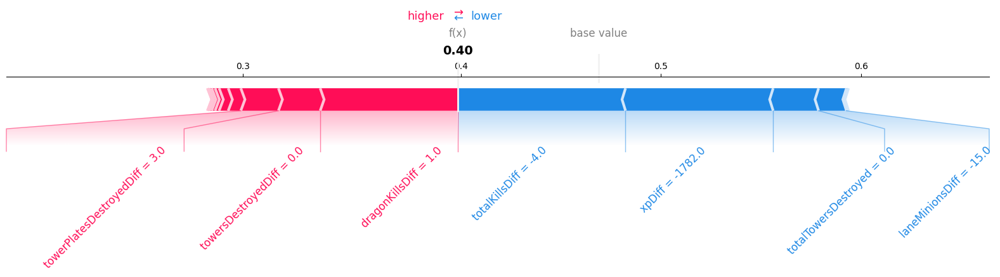

In [49]:
scaler: RobustScaler = best_model.named_steps['scaler']
model_logreg = best_model.named_steps['logreg']

# 2. Preparar los datos CORRECTOS (Escalados) para el Explainer
# Tomamos la muestra cruda y la escalamos
sample_data_raw = shap.sample(X_val, 50, random_state=0)
sample_data_scaled = scaler.transform(sample_data_raw)

# Tomamos la instancia cruda y la escalamos
instance_raw = X_val.iloc[[0]]  # DataFrame (crudo)
instance_scaled = scaler.transform(instance_raw)  # Numpy Array (escalado)

# 3. Crear el Explainer con datos ESCALADOS
# Ahora el modelo recibe lo que espera (números pequeños)
explainer = shap.LinearExplainer(model_logreg, sample_data_scaled)

# 4. Calcular SHAP values sobre la instancia ESCALADA
shap_values = explainer.shap_values(instance_scaled)

shap.initjs()
shap.force_plot(
    explainer.expected_value,
    shap_values[0],
    instance_raw.iloc[0],
    matplotlib=True,
    text_rotation=45,
    link="logit"
)

In [50]:
shap_values_summary = explainer.shap_values(sample_data_scaled)

/tmp/ipykernel_8433/2325263966.py:2: FutureWarning:

The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.



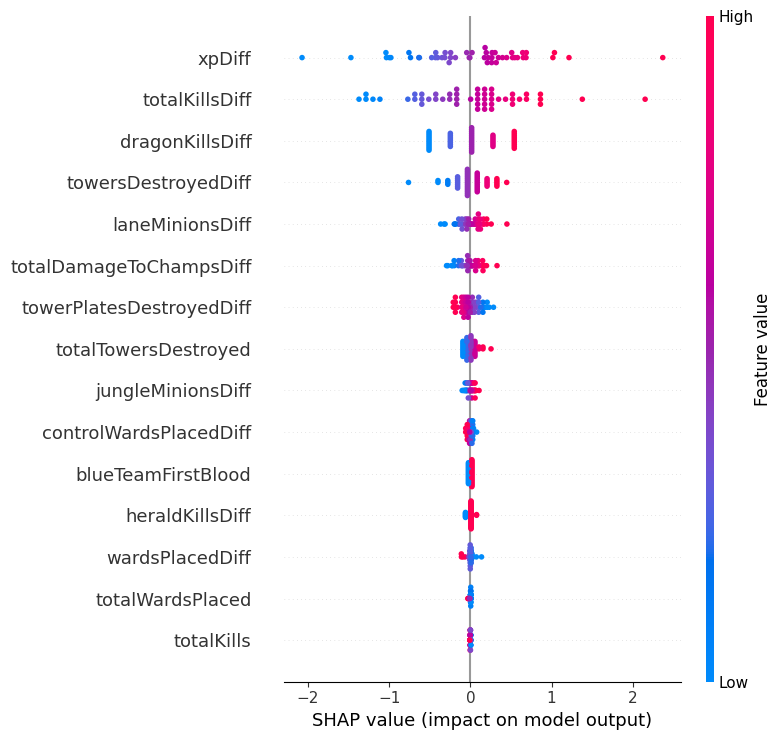

In [51]:
plt.figure(dpi=100)
shap.summary_plot(
    shap_values_summary,
    sample_data_raw,
    plot_type="dot",
    show=False
)

## KNN

In [52]:
from sklearn.neighbors import KNeighborsClassifier

In [53]:
df = pd.read_csv("data/match_data_compact.csv")
X = df.drop("blueTeamWin", axis=1)
y = df["blueTeamWin"]

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.4, random_state=42, stratify=y)
X_test, X_val, y_test, y_val = train_test_split(X_val, y_val, test_size=0.5, random_state=42, stratify=y_val)

pipeline = Pipeline([
    ('scaler', RobustScaler()),
    ('knn', KNeighborsClassifier())
])

param_grid = {
    "knn__n_neighbors": [103, 105, 107],
    "knn__weights": ['uniform', 'distance'],
    "knn__metric": ['euclidean', 'manhattan']
}

grid_search = GridSearchCV(pipeline, param_grid, cv=5, n_jobs=-1, scoring='accuracy')
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', RobustScaler()),
                                       ('knn', KNeighborsClassifier())]),
             n_jobs=-1,
             param_grid={'knn__metric': ['euclidean', 'manhattan'],
                         'knn__n_neighbors': [103, 105, 107],
                         'knn__weights': ['uniform', 'distance']},
             scoring='accuracy')

In [54]:
best_model = grid_search.best_estimator_
print(f"Mejores hiperparámetros: {grid_search.best_params_}")
print(f"Mejor accuracy en CV: {grid_search.best_score_:.4f}")

y_pred = best_model.predict(X_val)
print("Matriz de Confusión:")
print(confusion_matrix(y_val, y_pred))
print("\nReporte de Clasificación:")
print(classification_report(y_val, y_pred, target_names=["Red Team Win", "Blue Team Win"]))

Mejores hiperparámetros: {'knn__metric': 'manhattan', 'knn__n_neighbors': 103, 'knn__weights': 'distance'}
Mejor accuracy en CV: 0.7531
Matriz de Confusión:
[[1919  530]
 [ 610 1785]]

Reporte de Clasificación:
               precision    recall  f1-score   support

 Red Team Win       0.76      0.78      0.77      2449
Blue Team Win       0.77      0.75      0.76      2395

     accuracy                           0.76      4844
    macro avg       0.76      0.76      0.76      4844
 weighted avg       0.76      0.76      0.76      4844



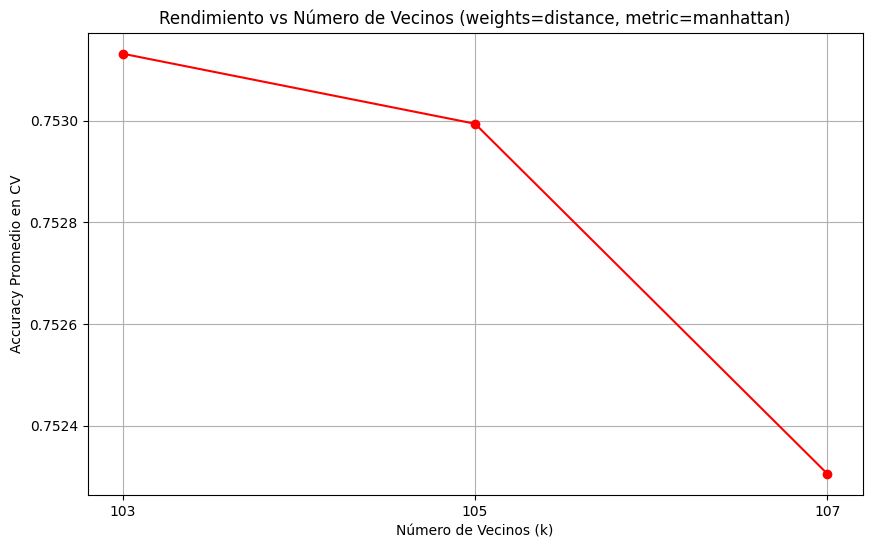

In [55]:
results = pd.DataFrame(grid_search.cv_results_)
best_weight = grid_search.best_params_['knn__weights']
best_distance = grid_search.best_params_['knn__metric']
results = results[(results['param_knn__weights'] == best_weight) & (results['param_knn__metric'] == best_distance)]

plt.figure(figsize=(10, 6))
plt.plot(results['param_knn__n_neighbors'], results['mean_test_score'], marker='o', color='r')
plt.title(f'Rendimiento vs Número de Vecinos (weights={best_weight}, metric={best_distance})')
plt.xlabel('Número de Vecinos (k)')
plt.ylabel('Accuracy Promedio en CV')
plt.xticks(results['param_knn__n_neighbors'])
plt.grid()
plt.show()

In [56]:
def predict_proba_wrapper(data):
    if isinstance(data, np.ndarray):
        data = pd.DataFrame(data, columns=X_train.columns)
    return best_model.predict_proba(data)


# Seleccionamos una muestra del conjunto de test para acelerar el cálculo de SHAP
sample_data = shap.sample(X_val, 50, random_state=0)

# Obtenemos el explainer SHAP
explainer = shap.KernelExplainer(predict_proba_wrapper, sample_data)

# Calculamos los valores SHAP para el conjunto de test
instance = X_val.iloc[[0]]
shap_values = explainer.shap_values(instance)

  0%|          | 0/1 [00:00<?, ?it/s]

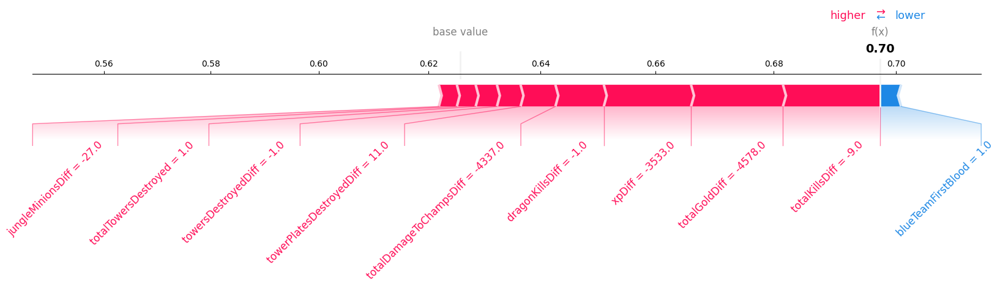

In [57]:
# Visualizamos los valores SHAP
shap.initjs()
shap.force_plot(
    explainer.expected_value[0],
    shap_values[0][:, 0],
    instance.iloc[0],
    matplotlib=True,
    text_rotation=45,
    link="logit"
)

In [58]:
shap_values_summary = explainer.shap_values(sample_data)

  0%|          | 0/50 [00:00<?, ?it/s]

/tmp/ipykernel_8433/1793275944.py:2: FutureWarning:

The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.



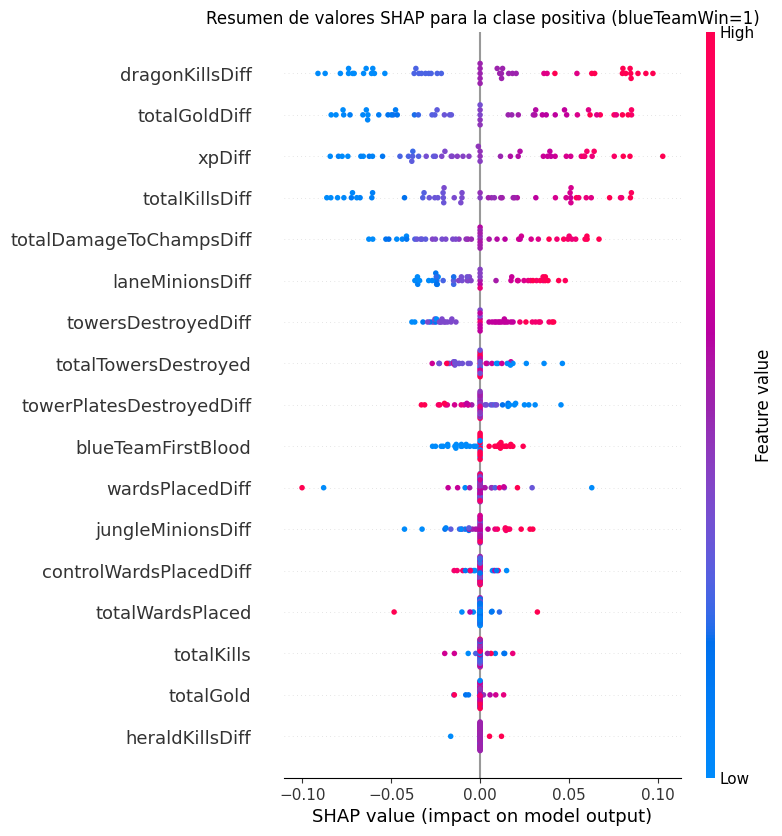

In [59]:
plt.figure(dpi=100)
shap.summary_plot(
    shap_values_summary[:, :, 1],
    sample_data,
    plot_type="dot",
    show=False
)
plt.title("Resumen de valores SHAP para la clase positiva (blueTeamWin=1)")
plt.show()

## Accuracy

In [60]:
from sklearn.svm import  LinearSVC
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier

In [61]:
df = pd.read_csv("data/match_data_compact.csv")

scaler = RobustScaler().set_output(transform="pandas")
X = df.drop(columns=["blueTeamWin"])
X = scaler.fit_transform(X)
y = df["blueTeamWin"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

In [62]:
dt = RandomForestClassifier()

param_grid = {
    'n_estimators':[10,100,500],
    'max_depth':[7,20,100], 
}

grid = GridSearchCV(
    estimator=dt,
    param_grid=param_grid,
    n_jobs=-1,
    cv = 5,
    scoring = 'accuracy'
)
grid.fit(X_train,y_train)

best_dt = grid.best_estimator_
print("Mejores parámetros:", grid.best_params_)
print("Mejor puntuación de validación cruzada:", grid.best_score_)


Mejores parámetros: {'max_depth': 7, 'n_estimators': 500}
Mejor puntuación de validación cruzada: 0.7640055058499656


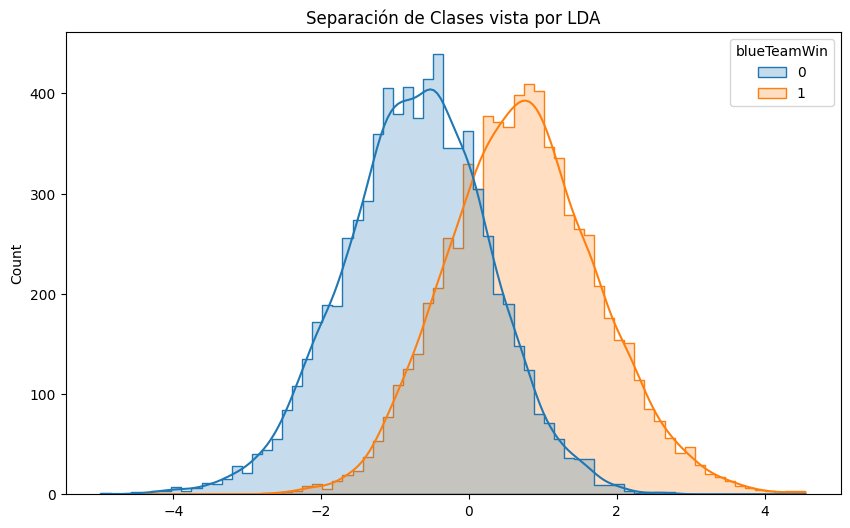

In [63]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis


lda = LinearDiscriminantAnalysis(n_components=1) 
X_lda = lda.fit_transform(X_train, y_train)




plt.figure(figsize=(10, 6))
sns.histplot(x=X_lda.flatten(), hue=y_train, kde=True, element="step")
plt.title("Separación de Clases vista por LDA")
plt.show()

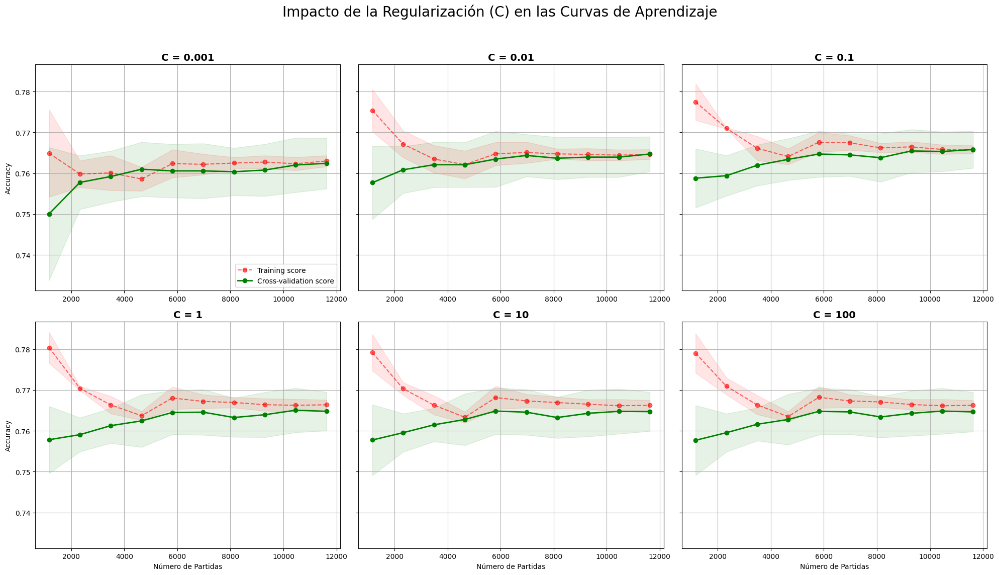

In [64]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.linear_model import LogisticRegression

# 1. Valores de C a probar (De muy restringido a muy libre)
c_values = [0.001, 0.01, 0.1, 1, 10, 100]

# 2. Configuración del panel de gráficos (2 filas x 3 columnas)
fig, axes = plt.subplots(2, 3, figsize=(20, 12), sharey=True)
axes = axes.flatten() # Aplanamos para poder iterar fácilmente

# Título general
fig.suptitle('Impacto de la Regularización (C) en las Curvas de Aprendizaje', fontsize=20)

# 3. Bucle para generar cada gráfico
for i, c in enumerate(c_values):
    ax = axes[i]
    
    # Creamos el modelo
    model = LogisticRegression(C=c, max_iter=2000, solver='lbfgs')
    
    # Calculamos curvas
    train_sizes, train_scores, test_scores = learning_curve(
        estimator=model,
        X=X_train, 
        y=y_train,
        cv=5,
        n_jobs=-1,
        train_sizes=np.linspace(0.1, 1.0, 10),
        scoring='accuracy'
    )
    
    # Medias y Desviaciones
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    test_mean = np.mean(test_scores, axis=1)
    test_std = np.std(test_scores, axis=1)
    
    # --- PINTAR TRAIN (Rojo) ---
    ax.plot(train_sizes, train_mean, 'o--', color="r", label="Training score", alpha=0.6)
    ax.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color="r")
    
    # --- PINTAR TEST (Verde) ---
    ax.plot(train_sizes, test_mean, 'o-', color="g", label="Cross-validation score", linewidth=2)
    ax.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color="g")
    
    # Decoración de cada subgráfico
    ax.set_title(f"C = {c}", fontsize=14, fontweight='bold')
    ax.grid(True)
    
    # Solo ponemos etiquetas en los bordes para no ensuciar
    if i >= 3: # Solo en la fila de abajo
        ax.set_xlabel("Número de Partidas")
    if i % 3 == 0: # Solo en la columna izquierda
        ax.set_ylabel("Accuracy")
        
    # Leyenda solo en el primer gráfico para no repetir
    if i == 0:
        ax.legend(loc="lower right")

plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Ajustar para que no choque con el título
plt.show()

In [65]:
from sklearn.neighbors import KNeighborsClassifier
import numpy as np

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

neighbors = knn.kneighbors(X_test, return_distance=False)
y_test_array = y_test.to_numpy() 


confused_points = 0
for i, neighbor_indices in enumerate(neighbors):
    true_label = y_test_array[i]
    neighbor_labels = y_train.iloc[neighbor_indices].values
    prediction = 1 if np.mean(neighbor_labels) > 0.5 else 0
    if prediction != true_label:
        confused_points += 1

print(f"Porcentaje de partidas que son geométricamente indistinguibles de su contrario: {confused_points / len(X_test) * 100:.2f}%")

Porcentaje de partidas que son geométricamente indistinguibles de su contrario: 29.18%


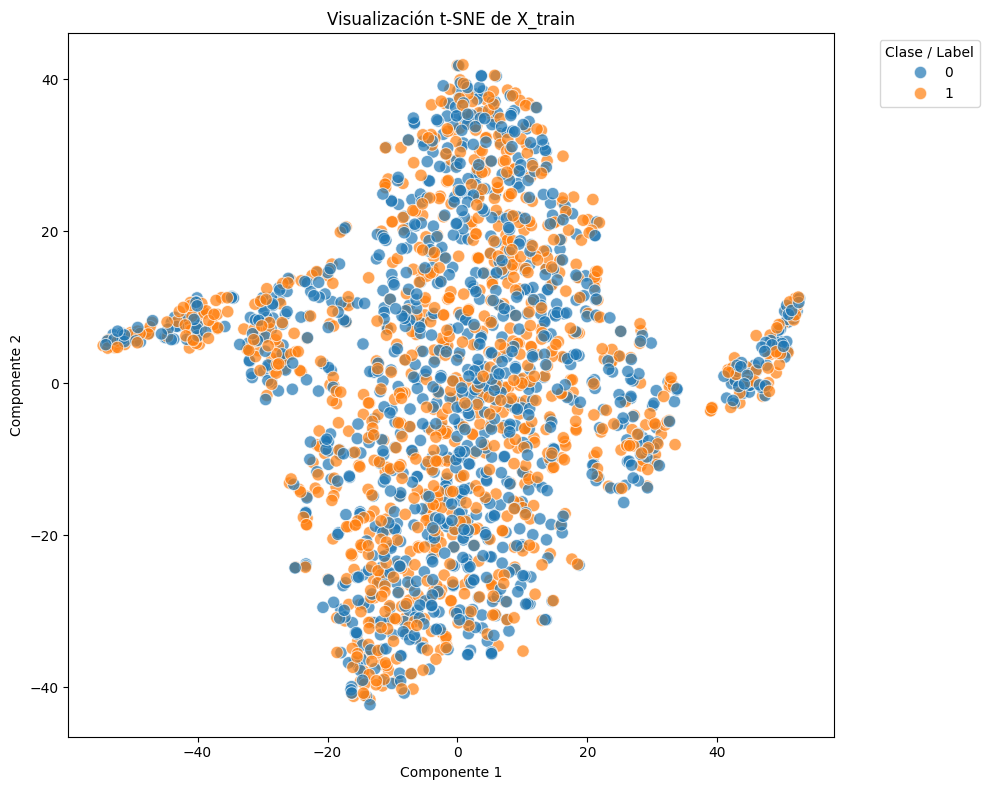

In [66]:
from sklearn.manifold import TSNE


tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=700)
X_embedded = tsne.fit_transform(X_train[:2000])

df_tsne = pd.DataFrame(X_embedded, columns=['Dimensión 1', 'Dimensión 2'])

df_tsne['Target'] = y.reset_index(drop=True)


plt.figure(figsize=(10, 8))
sns.scatterplot(
    data=df_tsne,
    x='Dimensión 1',
    y='Dimensión 2',
    hue='Target',       
    s=80,              
    alpha=0.7          
)

plt.title('Visualización t-SNE de X_train')
plt.xlabel('Componente 1')
plt.ylabel('Componente 2')
plt.legend(title='Clase / Label', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout() 
plt.show()

## Final Model

Hemos decidido usar el modelo de regresión 

In [67]:
modelo = log_model

In [86]:
df = pd.read_csv("data/match_data_no_gold.csv")

X = df.drop(columns=["blueTeamWin"])

y = df["blueTeamWin"]

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.4, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_val, y_val, test_size=0.5, random_state=42)

In [87]:
y_pred = log_model.predict(X_test)

In [90]:
(log_model.predict(X_test) == y_test).mean()

0.7566061106523534

In [93]:
print(classification_report(y_test, y_pred, target_names=["Red Team Win", "Blue Team Win"]))

               precision    recall  f1-score   support

 Red Team Win       0.76      0.76      0.76      2455
Blue Team Win       0.76      0.75      0.75      2389

     accuracy                           0.76      4844
    macro avg       0.76      0.76      0.76      4844
 weighted avg       0.76      0.76      0.76      4844

